In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import healpy as hp
from scipy.stats import binned_statistic
import rubin_sim.maf as maf
from rubin_sim.data import get_baseline
from rubin_sim.maf import TemplateTime

In [2]:
nside = 64
s = maf.HealpixSlicer(nside=nside)

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


In [3]:
opsdb = get_baseline()
run_name = os.path.split(opsdb)[-1].replace('.db', '')

# %pdb

In [4]:
bdict = {}
for f in 'ugrizy':
    m = TemplateTime(metric_name=f'Template {f}')
    constraint = f'filter == "{f}" and night < 365'
    bdict[f] = maf.MetricBundle(m, s, constraint, run_name=run_name)
    
g = maf.MetricBundleGroup(bdict, opsdb, 'temp')
g.run_all()

In [20]:
#bdict.metric_values()

In [5]:
bdict.keys()

dict_keys(['u', 'g', 'r', 'i', 'z', 'y', 'Template u_reduceN_images_until_template', 'Template u_reduceN_images_with_template', 'Template u_reduceN_nights_without_template', 'Template u_reduceNight_template_created', 'Template u_reduceTemplate_m5', 'Template u_reduceTotal_alerts', 'Template z_reduceN_images_until_template', 'Template z_reduceN_images_with_template', 'Template z_reduceN_nights_without_template', 'Template z_reduceNight_template_created', 'Template z_reduceTemplate_m5', 'Template z_reduceTotal_alerts', 'Template r_reduceN_images_until_template', 'Template r_reduceN_images_with_template', 'Template r_reduceN_nights_without_template', 'Template r_reduceNight_template_created', 'Template r_reduceTemplate_m5', 'Template r_reduceTotal_alerts', 'Template g_reduceN_images_until_template', 'Template g_reduceN_images_with_template', 'Template g_reduceN_nights_without_template', 'Template g_reduceNight_template_created', 'Template g_reduceTemplate_m5', 'Template g_reduceTotal_aler

In [6]:
def get_lc(v):
    """Extract lightcurves saved with `outputLc=True` from the metric datastructure
    
    Parameters
    ----------
    v : `metricValue`
        Input metricValue containing the lightcurve
    
    Returns
    -------
    lc : dict
        dict with columns `t`, `mag`, `mag_unc`, `maglim`, `filter`
    """
    if v is not None:
        return v['Diffim_lc']
    else:
        pass
        #return None

In [14]:
[(v['Template_input_m5s'],v['Template_m5']) for v in bdict['r'].metric_values.tolist() if v is not None and v['Template_m5'] < 10]

[]

In [7]:
lcs = [get_lc(v) for v in bdict['r'].metric_values.tolist() if get_lc(v) is not None]
lcs = [lc for lc in lcs if len(lc['diff_m5']) > 0] # time series of limiting magnitude

In [8]:
lcs

[{'mjd': array([60322.13406582, 60338.08771073]),
  'diff_m5': array([23.29551637, 23.01357435]),
  'band': array(['r', 'r'], dtype=object),
  'science_m5': array([23.4594011 , 23.10501559]),
  'n_alerts': array([1436.51386681,  973.07118418])},
 {'mjd': array([60322.13406582]),
  'diff_m5': array([23.29597281]),
  'band': array(['r'], dtype=object),
  'science_m5': array([23.4594011]),
  'n_alerts': array([1437.42000928])},
 {'mjd': array([60322.13406582, 60322.13496292]),
  'diff_m5': array([23.30055127, 23.31641497]),
  'band': array(['r', 'r'], dtype=object),
  'science_m5': array([23.4594011 , 23.48076456]),
  'n_alerts': array([1446.54104423, 1478.59413694])},
 {'mjd': array([60338.08905278]),
  'diff_m5': array([22.88965794]),
  'band': array(['r'], dtype=object),
  'science_m5': array([22.9497126]),
  'n_alerts': array([819.96395779])},
 {'mjd': array([60338.08905278]),
  'diff_m5': array([22.88774128]),
  'band': array(['r'], dtype=object),
  'science_m5': array([22.9497126]),

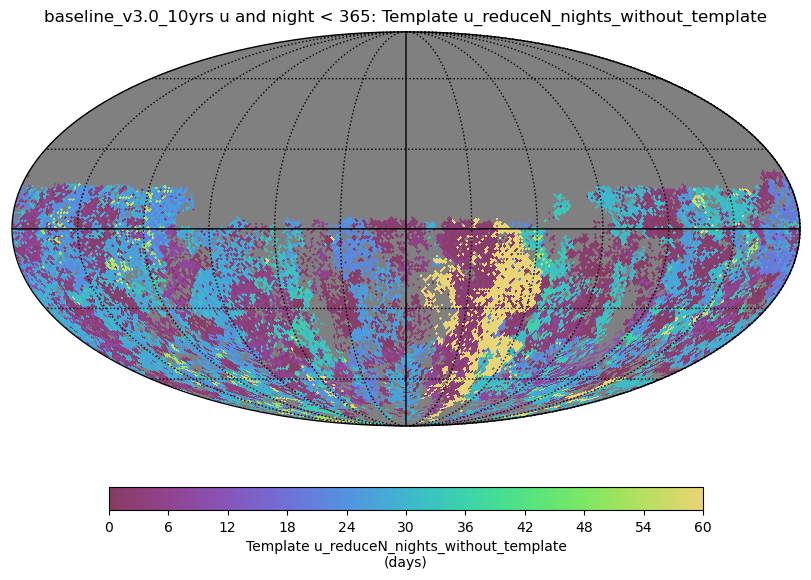

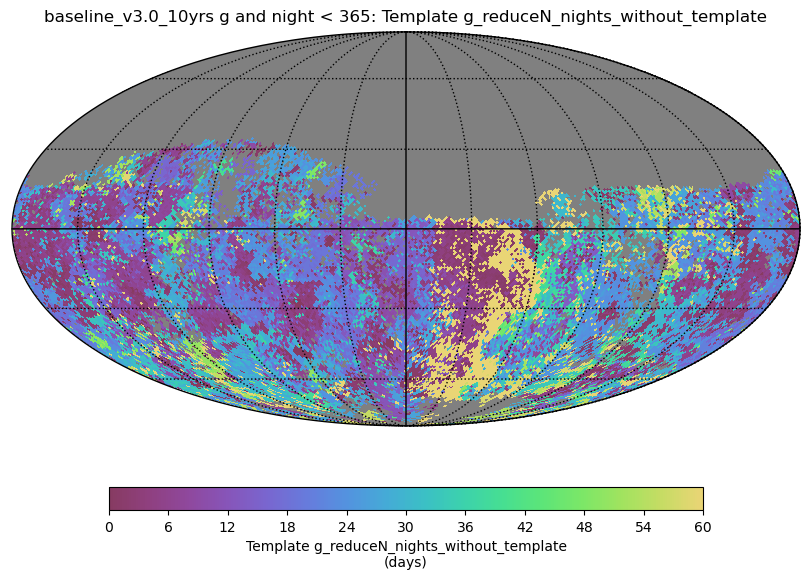

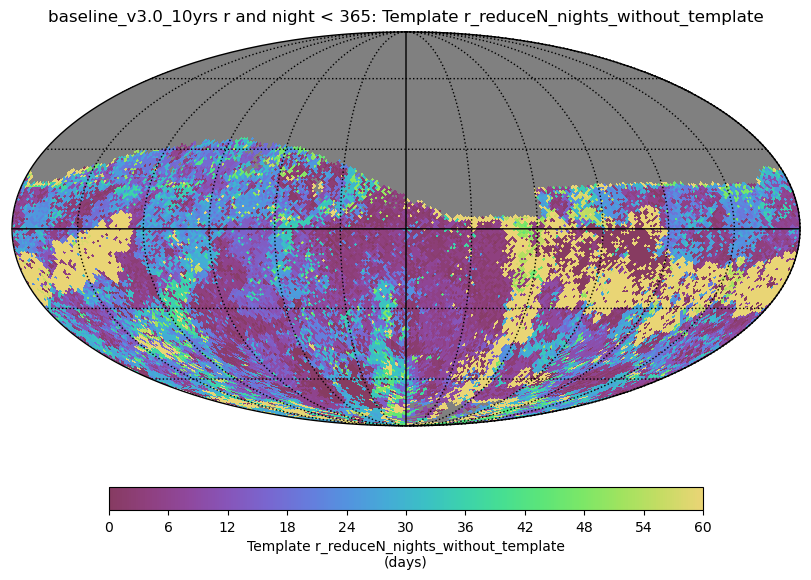

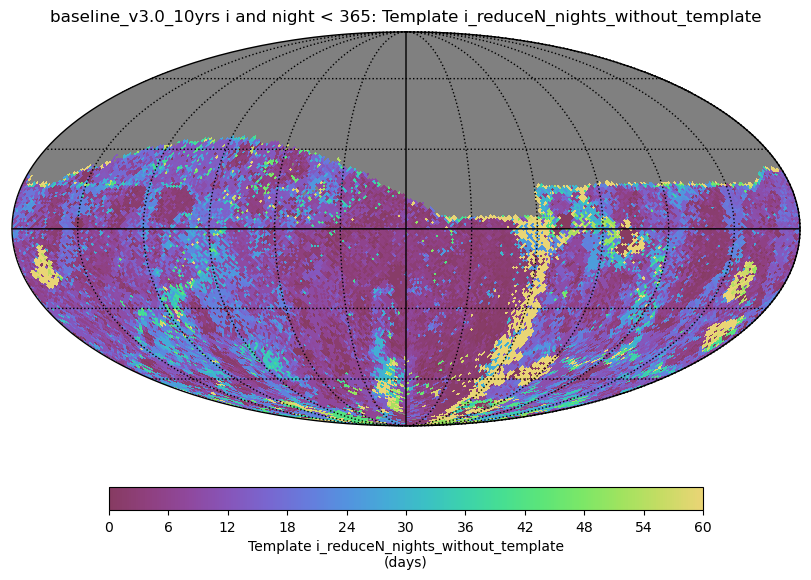

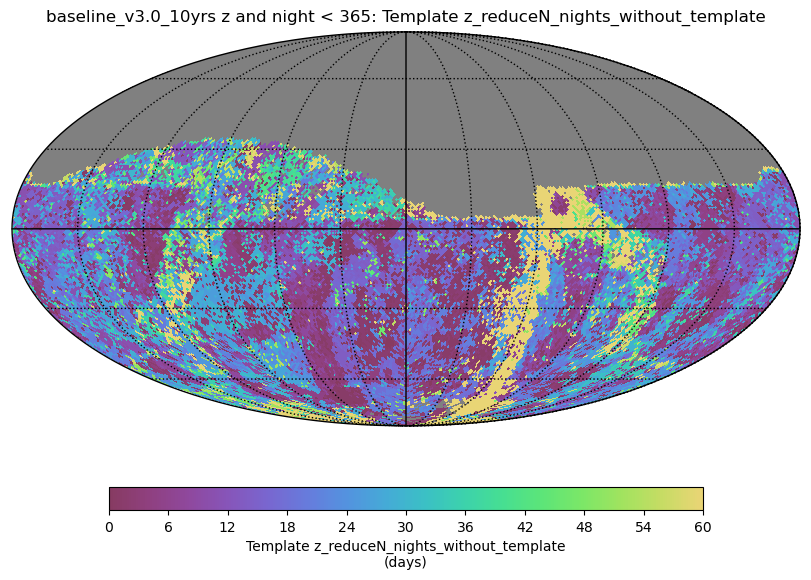

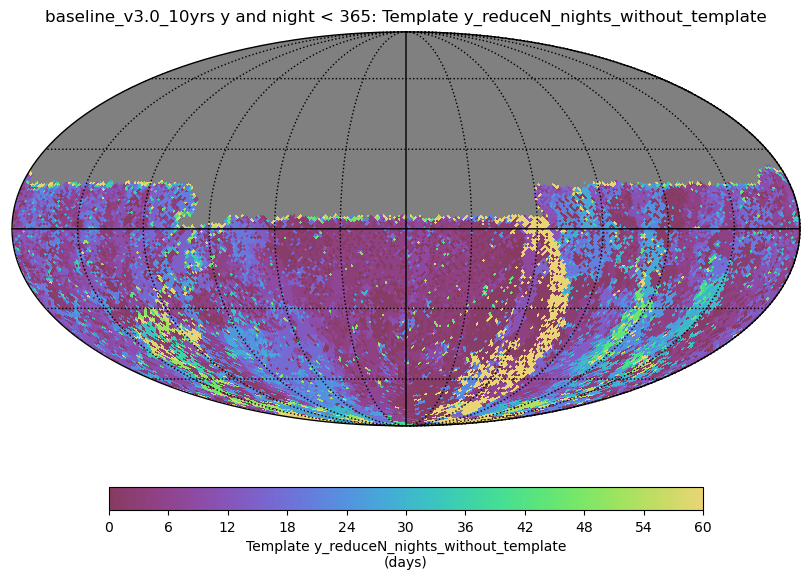

In [10]:
ph = maf.PlotHandler(out_dir='temp', thumbnail=False)

for f in 'ugrizy':
    k = f'Template {f}_reduceN_nights_without_template'
    ph.set_metric_bundles([bdict[k]])
    plotDict = {'figsize': (8, 6), 'color_min': 0, 'color_max': 60}
    ph.plot(plot_func=maf.HealpixSkyMap(), plot_dicts=plotDict)

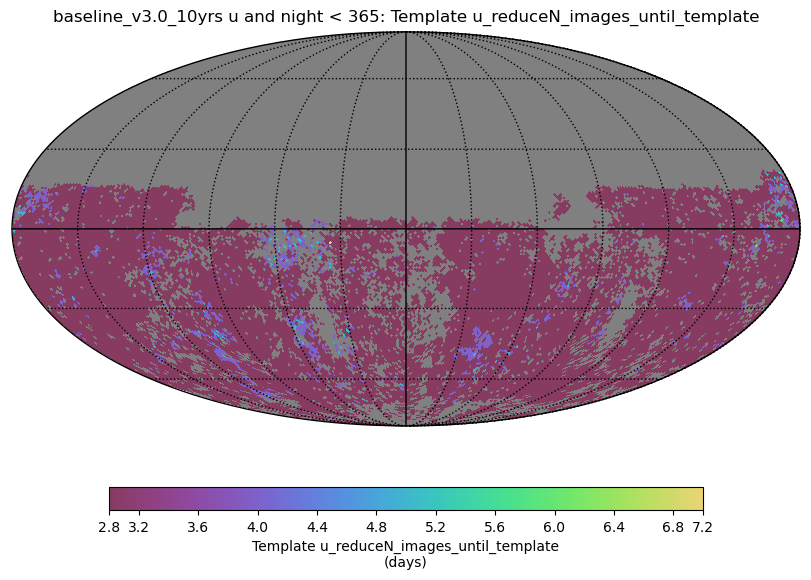

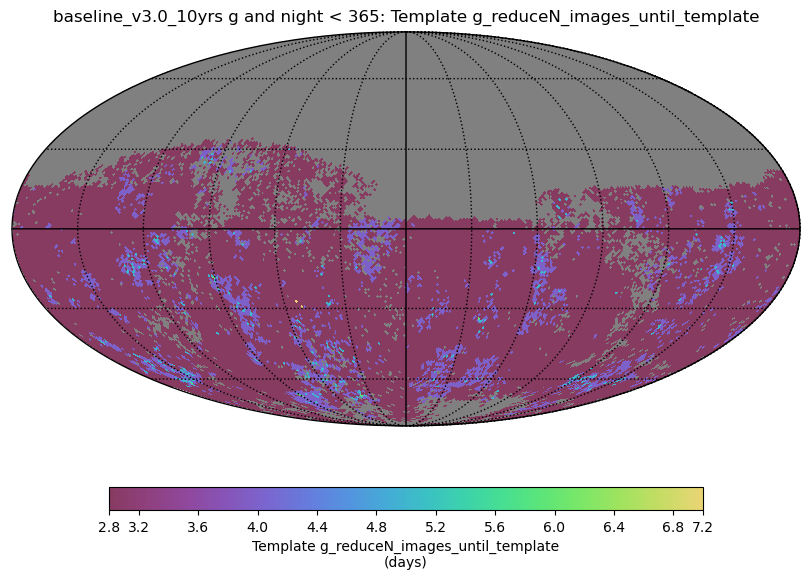

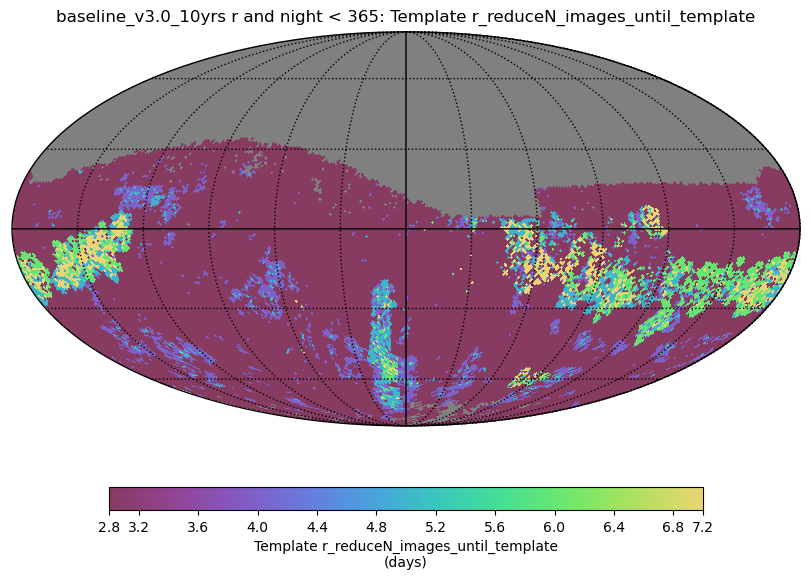

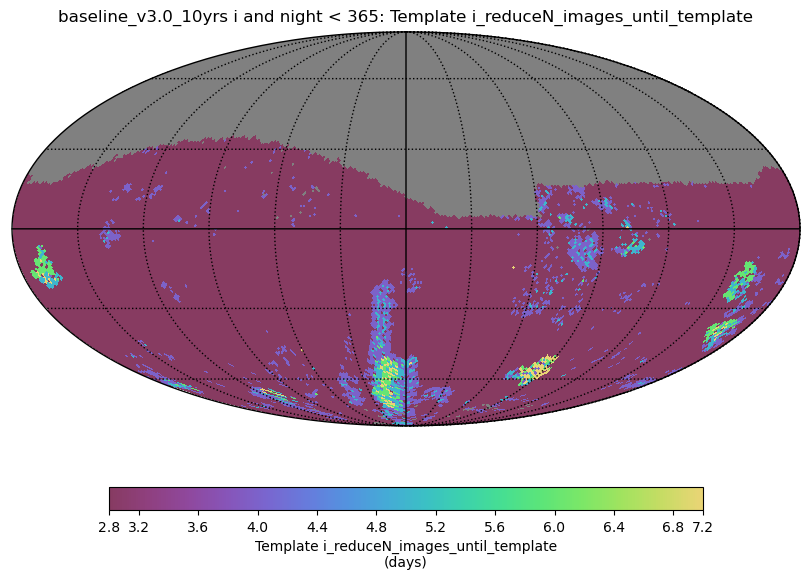

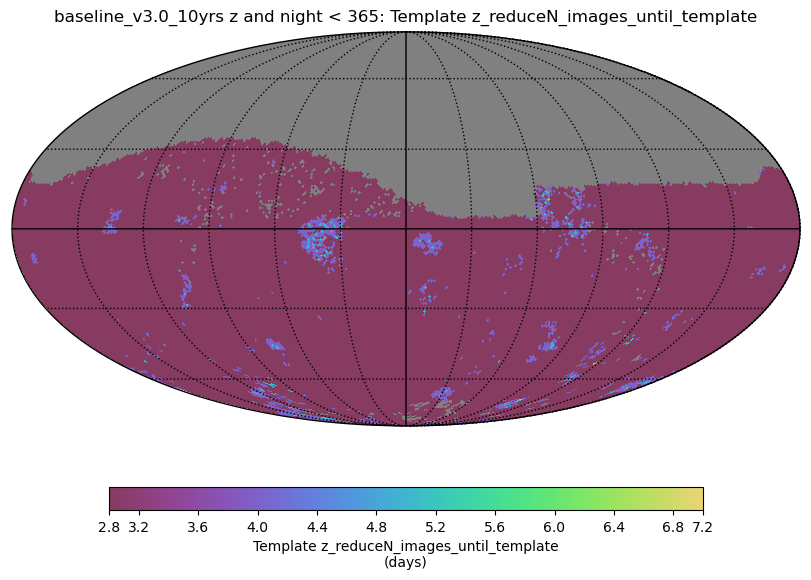

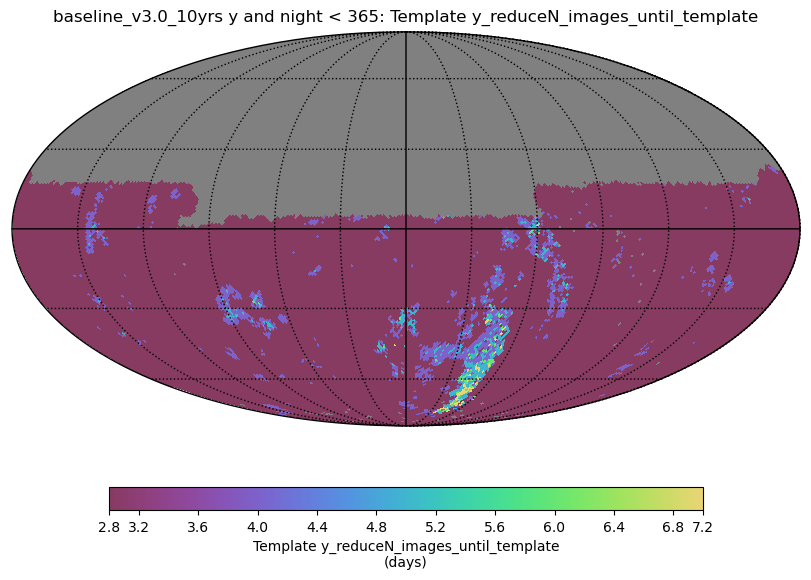

In [11]:
for f in 'ugrizy':
    k = f'Template {f}_reduceN_images_until_template'
    ph.set_metric_bundles([bdict[k]])
    plotDict = {'figsize': (8, 6), 'color_min': 3, 'color_max': 7}
    ph.plot(plot_func=maf.HealpixSkyMap(), plot_dicts=plotDict)

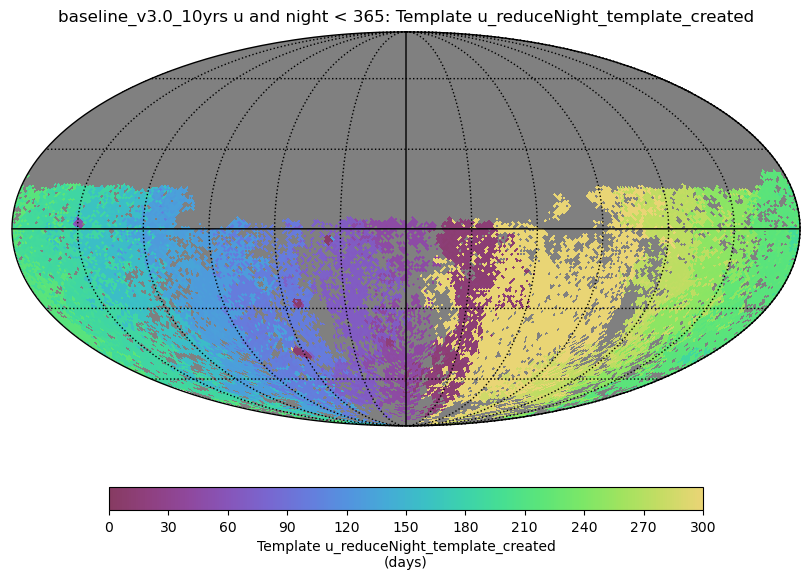

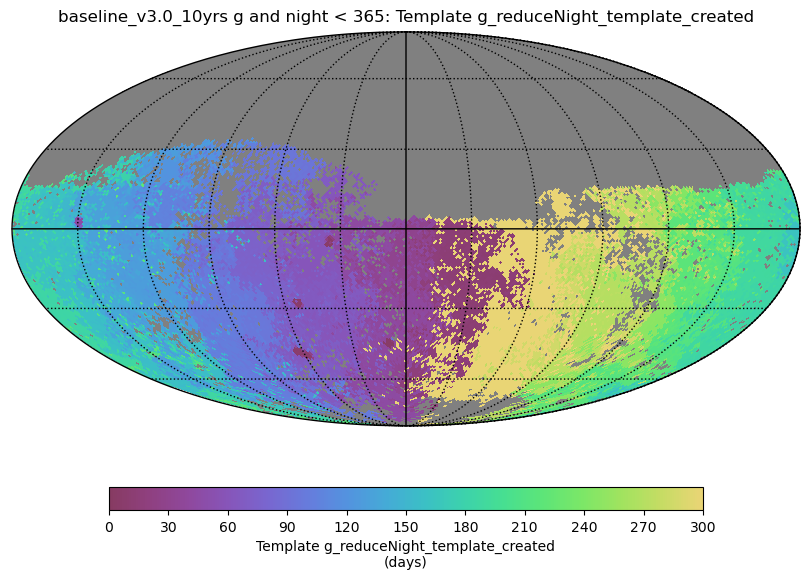

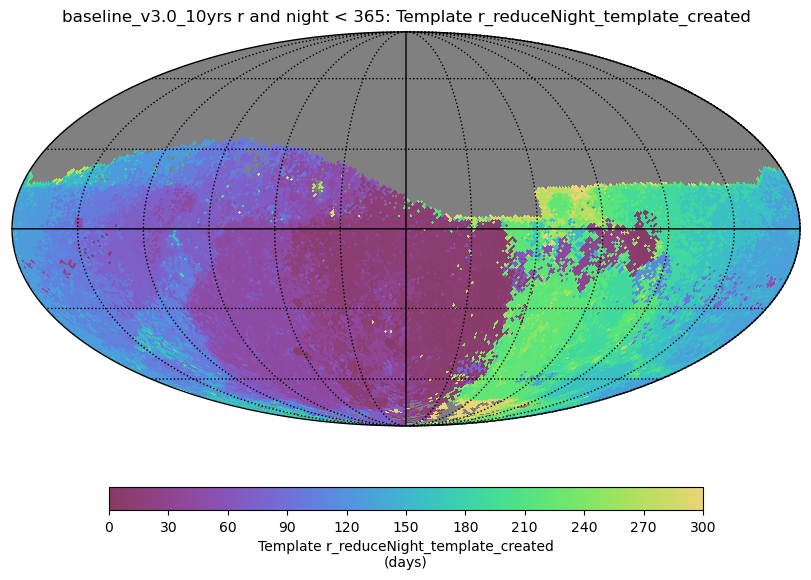

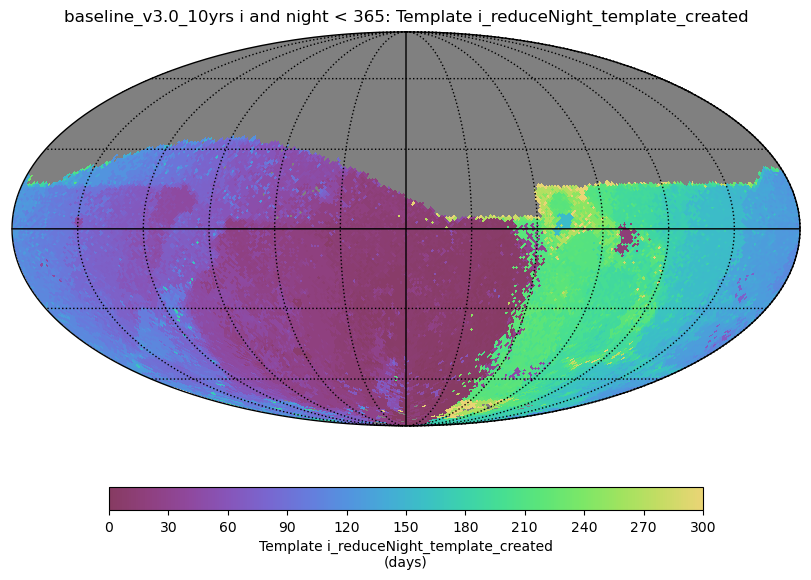

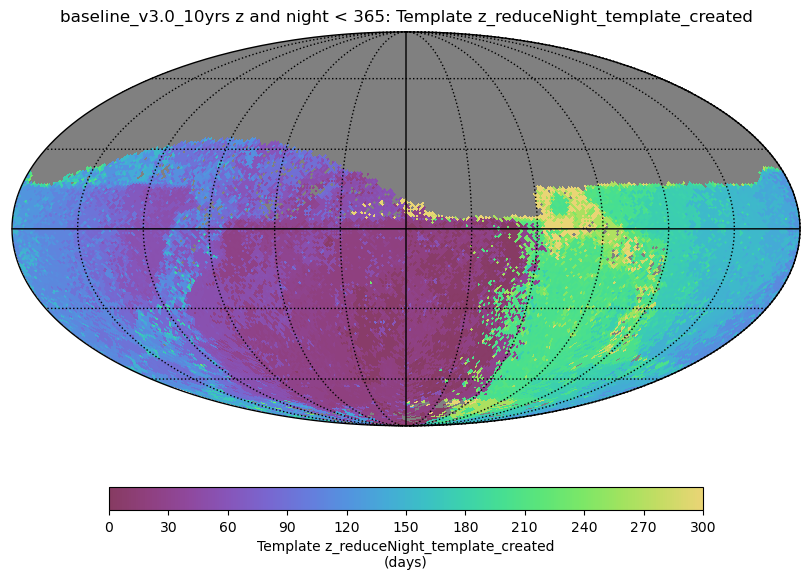

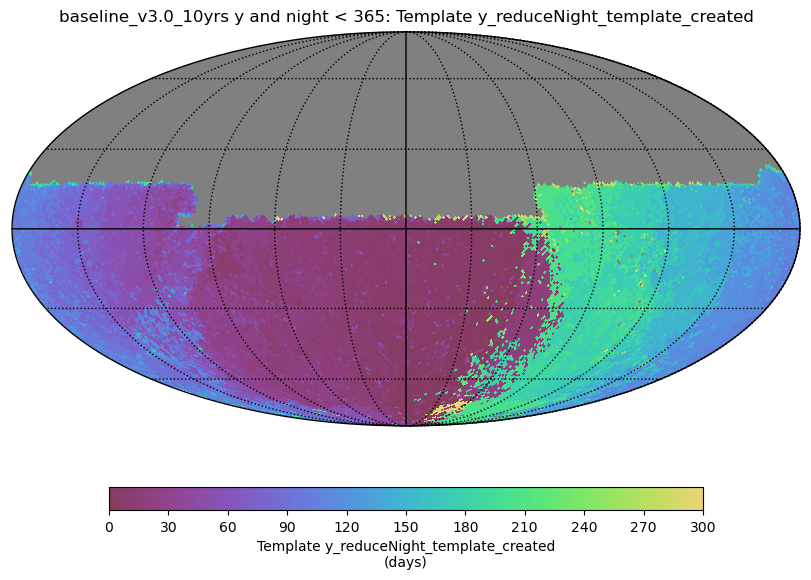

In [12]:
for f in 'ugrizy':
    k = f'Template {f}_reduceNight_template_created'
    ph.set_metric_bundles([bdict[k]])
    plotDict = {'figsize': (8, 6), 'color_min': 0, 'color_max': 300}
    ph.plot(plot_func=maf.HealpixSkyMap(), plot_dicts=plotDict)   

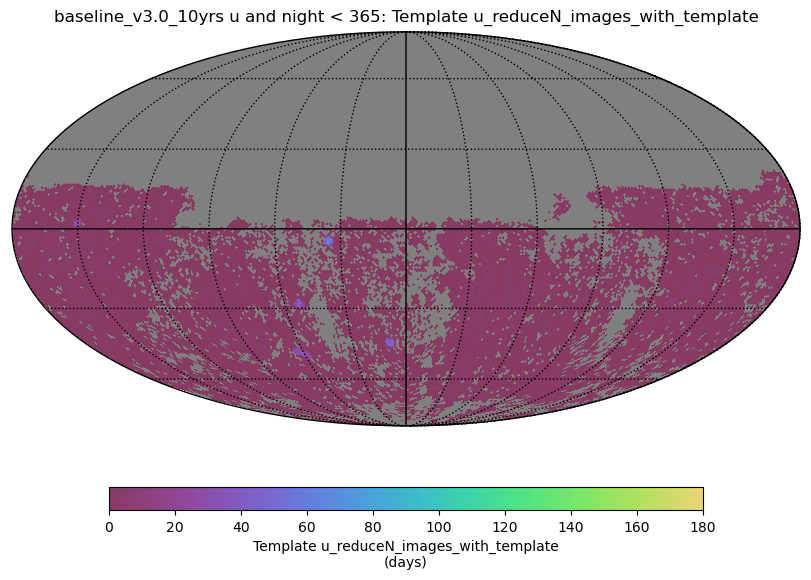

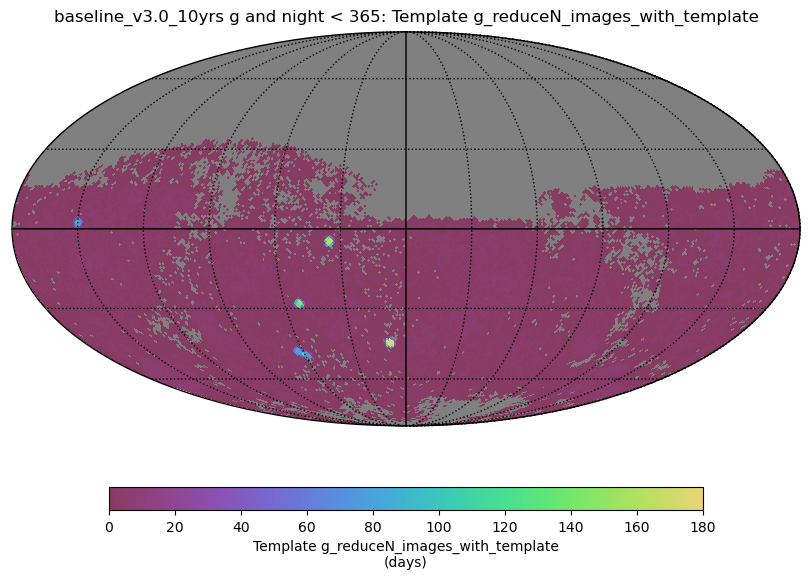

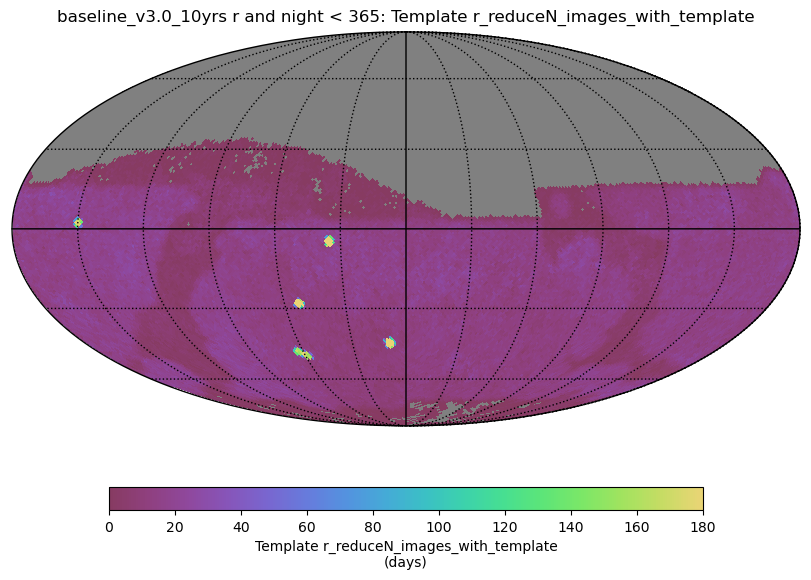

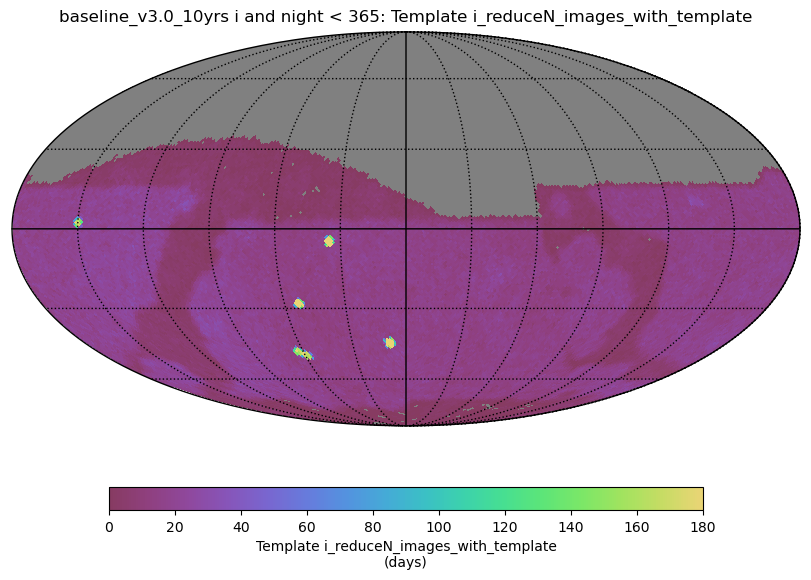

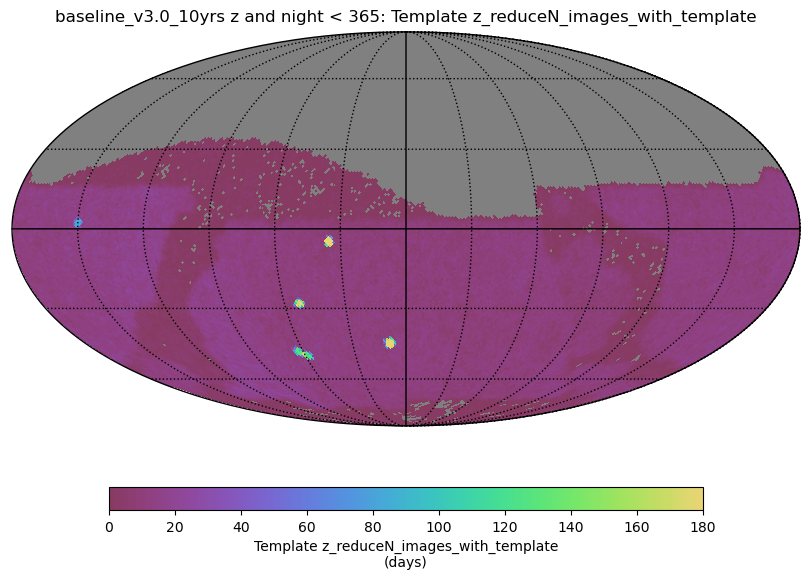

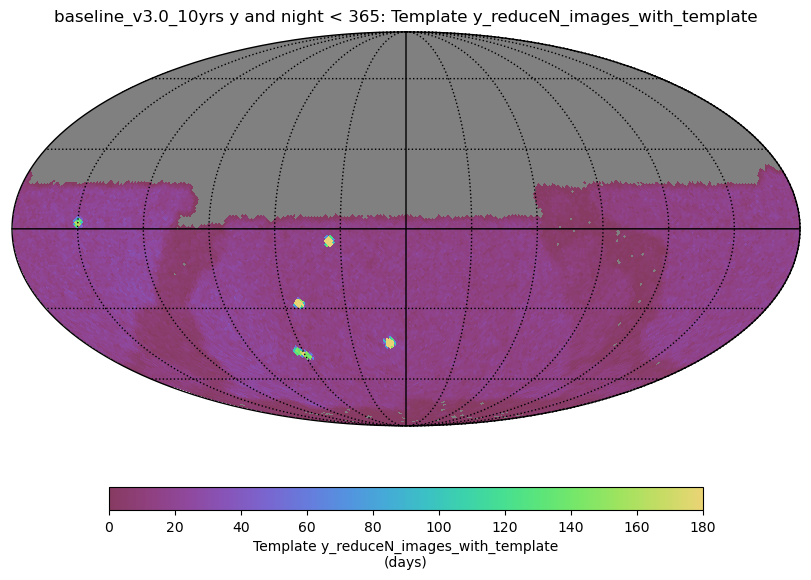

In [13]:
for f in 'ugrizy':
    k = f'Template {f}_reduceN_images_with_template'
    ph.set_metric_bundles([bdict[k]])
    plotDict = {'figsize': (8, 6), 'color_min': 0, 'color_max': 180}
    ph.plot(plot_func=maf.HealpixSkyMap(), plot_dicts=plotDict)
    
#returns days instead of images (need to fix)

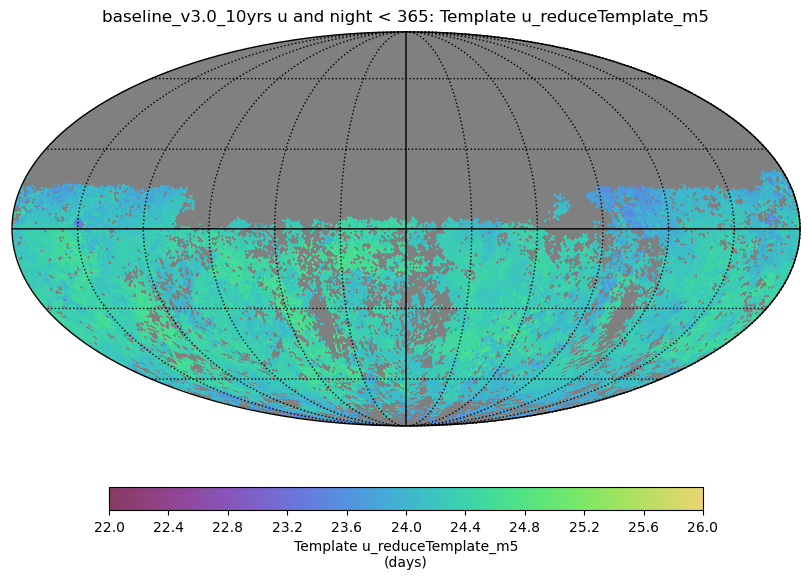

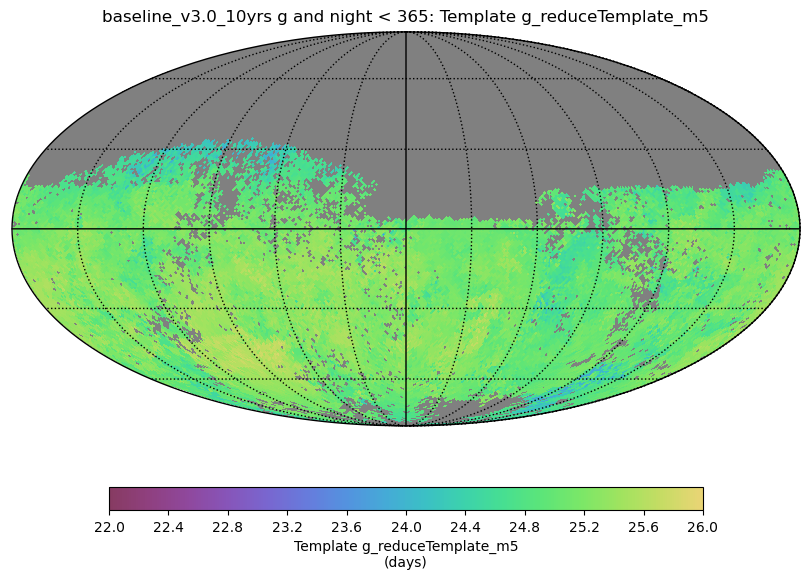

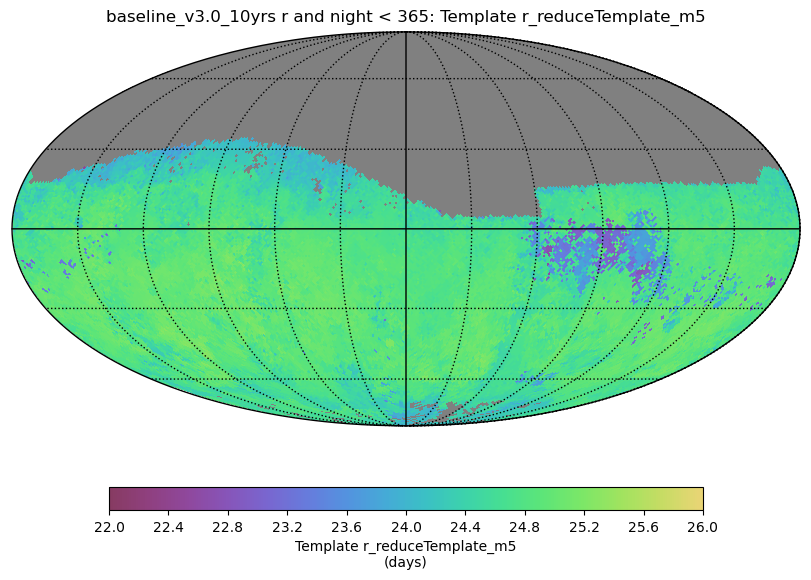

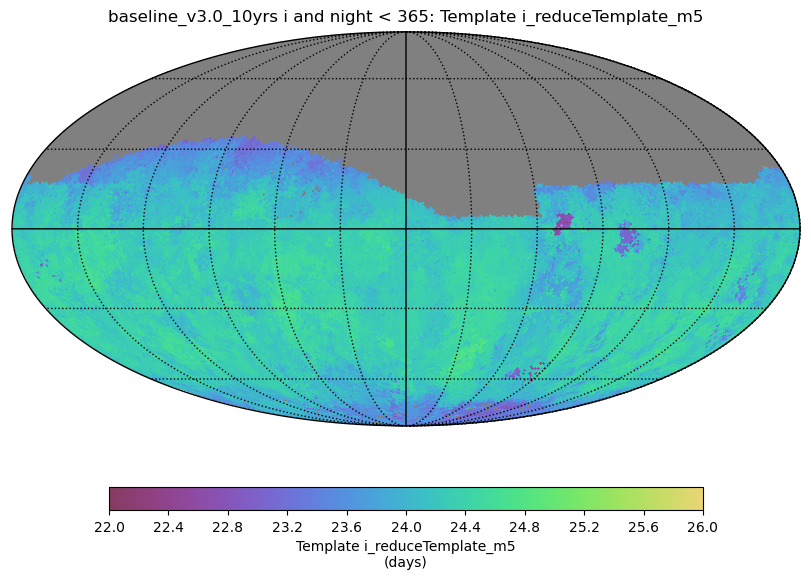

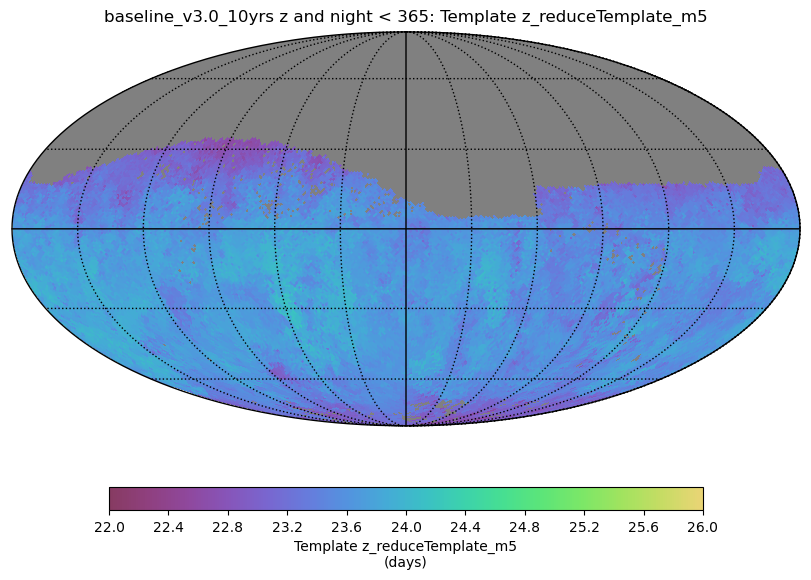

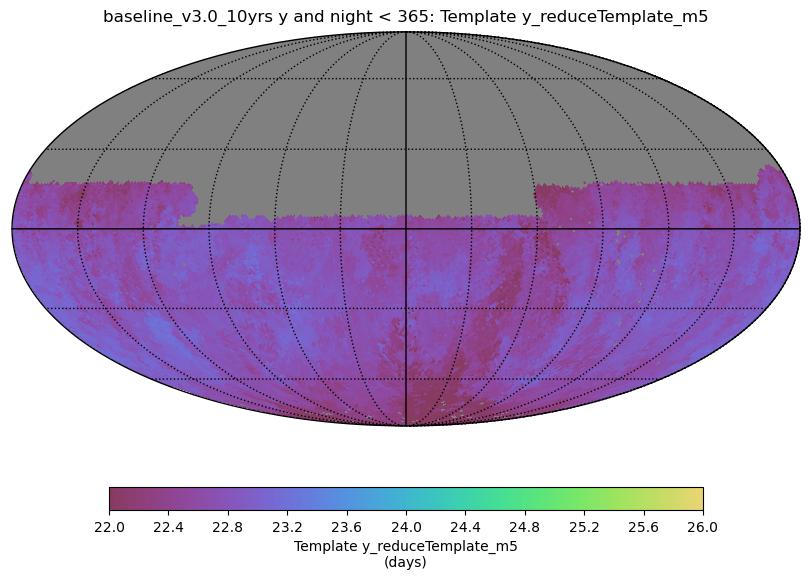

In [10]:
for f in 'ugrizy':
    k = f'Template {f}_reduceTemplate_m5'
    ph.set_metric_bundles([bdict[k]])
    plotDict = {'figsize': (8, 6), 'color_min': 22, 'color_max': 26}
    ph.plot(plot_func=maf.HealpixSkyMap(), plot_dicts=plotDict)

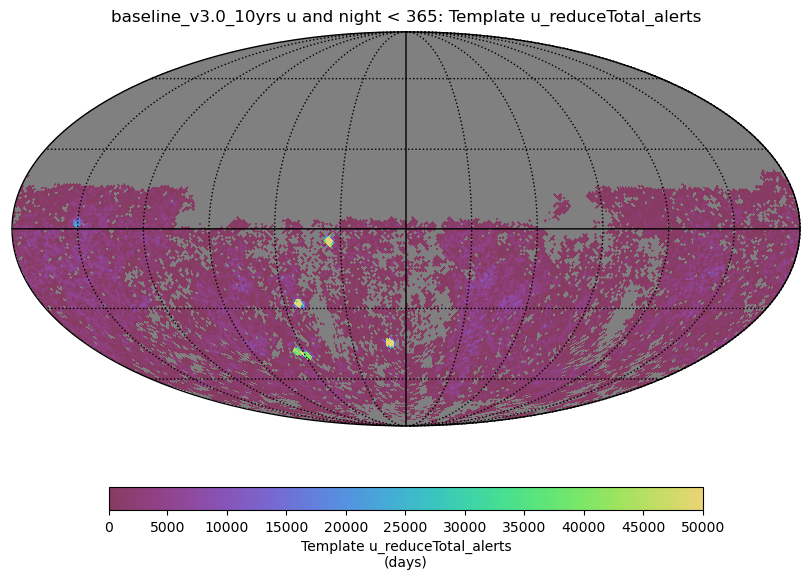

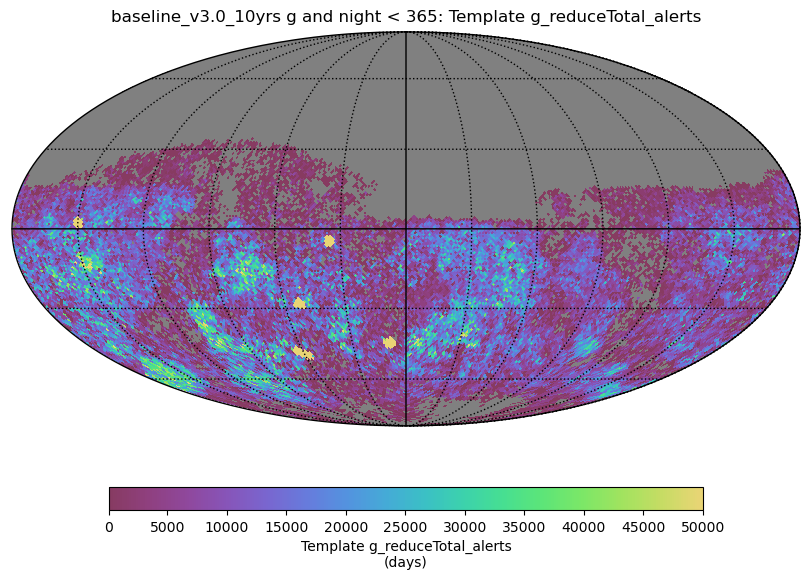

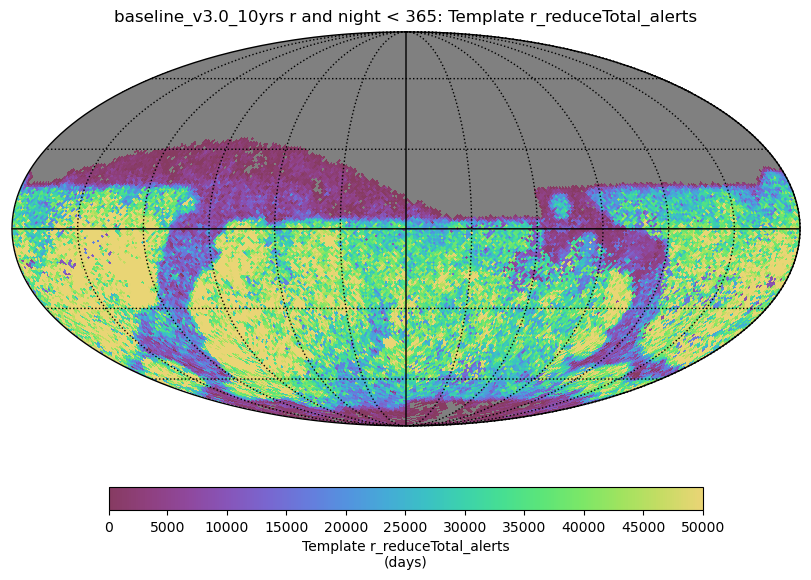

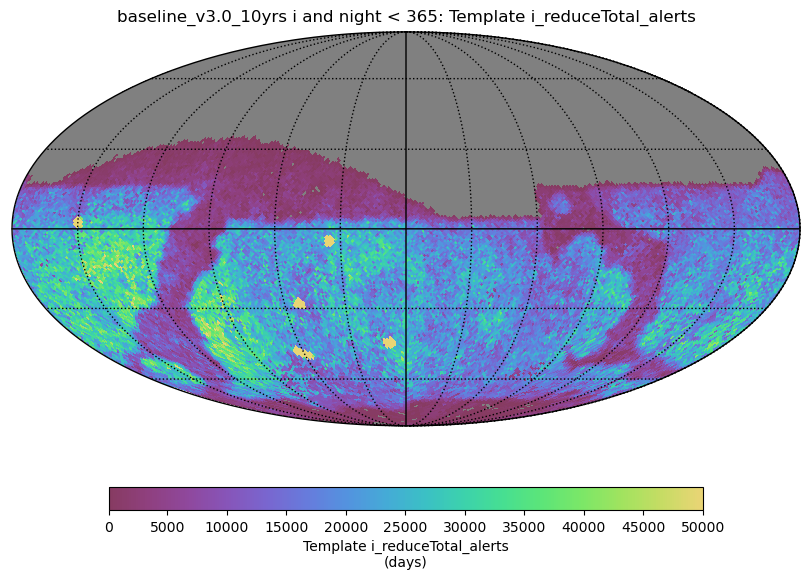

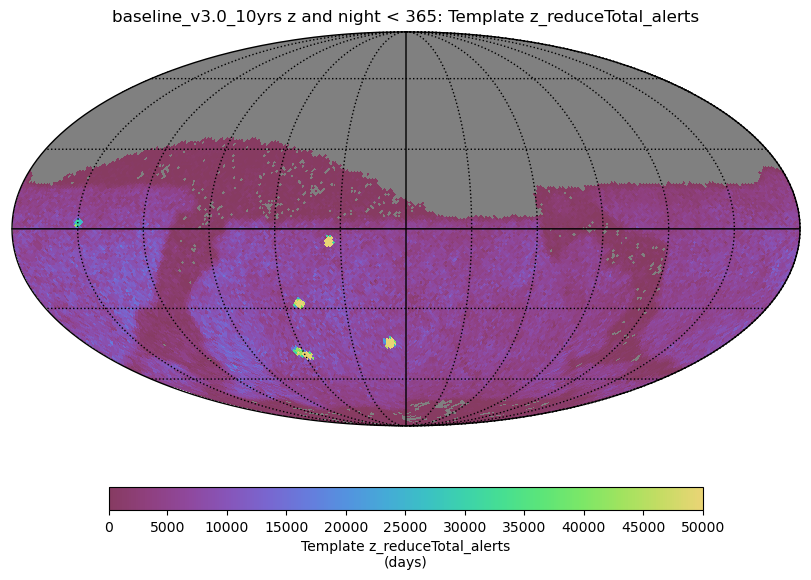

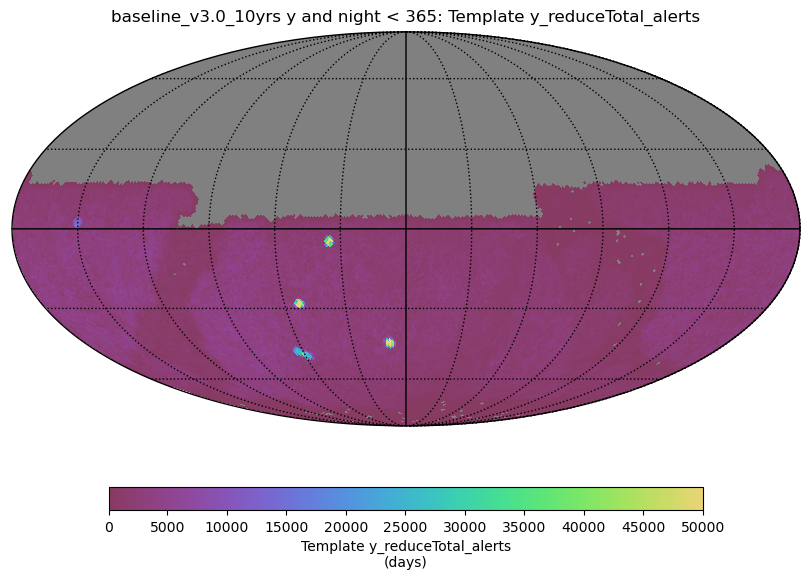

In [21]:
for f in 'ugrizy':
    k = f'Template {f}_reduceTotal_alerts'
    ph.set_metric_bundles([bdict[k]])
    plotDict = {'figsize': (8, 6), 'color_min': 100, 'color_max': 50000}
    ph.plot(plot_func=maf.HealpixSkyMap(), plot_dicts=plotDict)

In [14]:
nights = np.arange(0, 3650, 1)
pixarea = hp.nside2pixarea(nside, degrees=True)
area_over_time = {}
area_since_first = {}
for f in 'ugrizy':
    k = f'Template {f}_reduceNight_template_created'
    counts, bins = np.histogram(bdict[k].metric_values.compressed(), bins=nights)
    area_over_time[f] = counts.cumsum() * pixarea 
    k = f'Template {f}_reduceN_nights_without_template'
    counts, bins = np.histogram(bdict[k].metric_values.compressed(), bins=nights)
    area_since_first[f] = counts.cumsum() * pixarea 

In [15]:
# Count up area in footprint, for reference (varies by filter)
footprint_area = {}
for f in 'ugrizy':
    k = f'Template {f}_reduceNight_template_created'
    footprint_area[f] = len(bdict[k].metric_values.compressed()) * pixarea

{'u': 18718.766169144652, 'g': 23882.93996812896, 'r': 27291.311461331512, 'i': 27577.510594348518, 'z': 27146.95295435519, 'y': 24670.197407337037}


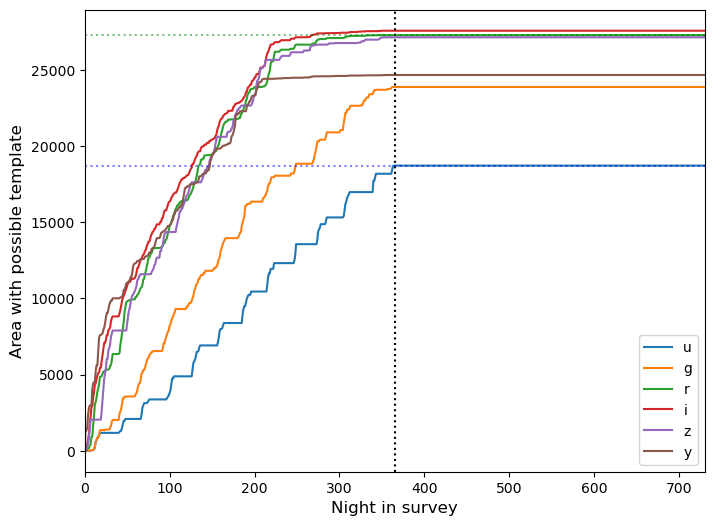

In [16]:
plt.figure(figsize=(8, 6))
for f in 'ugrizy':
    plt.plot(nights[:-1], area_over_time[f], label=f)
plt.legend()
plt.xlim(0, 365*2)
plt.xlabel('Night in survey', fontsize='large')
plt.ylabel('Area with possible template', fontsize='large')
plt.axvline(365, color='k', linestyle=':')
plt.axhline(footprint_area['u'], color='b', linestyle=':', alpha=0.5)
plt.axhline(footprint_area['r'], color='g', linestyle=':', alpha=0.5)
print(footprint_area)

{'u': 18718.766169144652, 'g': 23882.93996812896, 'r': 27291.311461331512, 'i': 27577.510594348518, 'z': 27146.95295435519, 'y': 24670.197407337037}


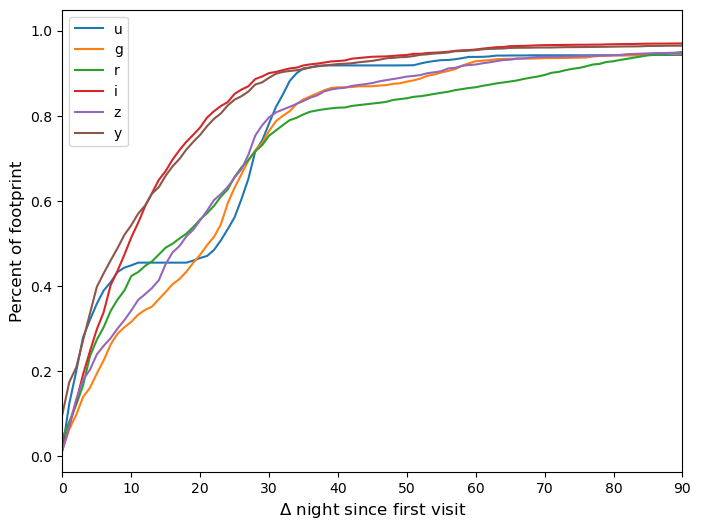

In [17]:
plt.figure(figsize=(8, 6))
for f in 'ugrizy':
    # Show percent of footprint 
    plt.plot(nights[:-1], area_since_first[f] / footprint_area[f], label=f)
plt.legend()
plt.xlim(0, 365*2)
plt.xlim(0, 90)
plt.xlabel(r'$\Delta$ night since first visit', fontsize='large')
#plt.ylabel('Area with possible template', fontsize='large')
plt.ylabel('Percent of footprint', fontsize='large')
plt.axvline(365, color='k', linestyle=':')
print(footprint_area)

In [18]:
visit_maps= {}
for f in 'ugrizy':
    visit_maps[f + ' 1yr'] = maf.MetricBundle(maf.CountMetric(col='observationStartMJD', metric_name='Nvisits'),
                                    maf.HealpixSlicer(nside=128),
                                    f"night < 365.25 and filter = '{f}'", run_name=run_name)
    visit_maps[f + ' 2yr'] = maf.MetricBundle(maf.CountMetric(col='observationStartMJD', metric_name='Nvisits'),
                                    maf.HealpixSlicer(nside=128),
                                    f"night < 365.25*2 and filter = '{f}'", run_name=run_name)
g2 = maf.MetricBundleGroup(visit_maps, opsdb, 'temp')
g2.run_all()

Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes


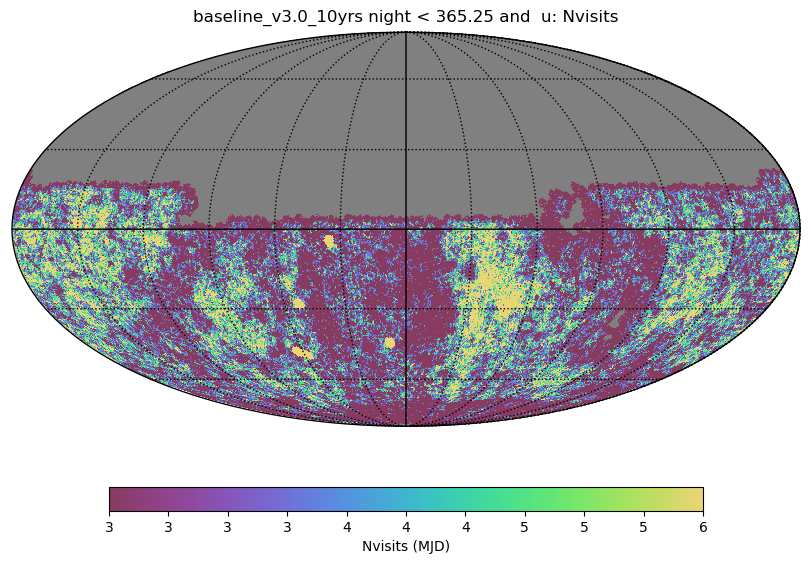

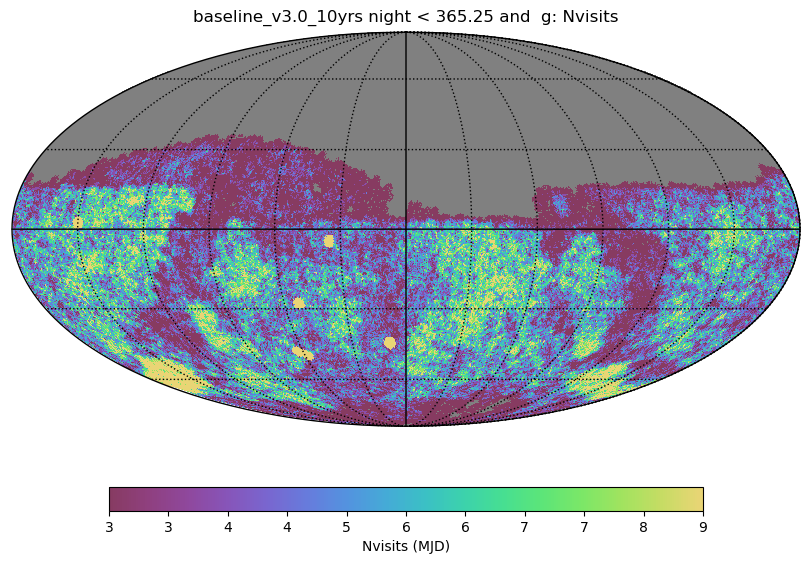

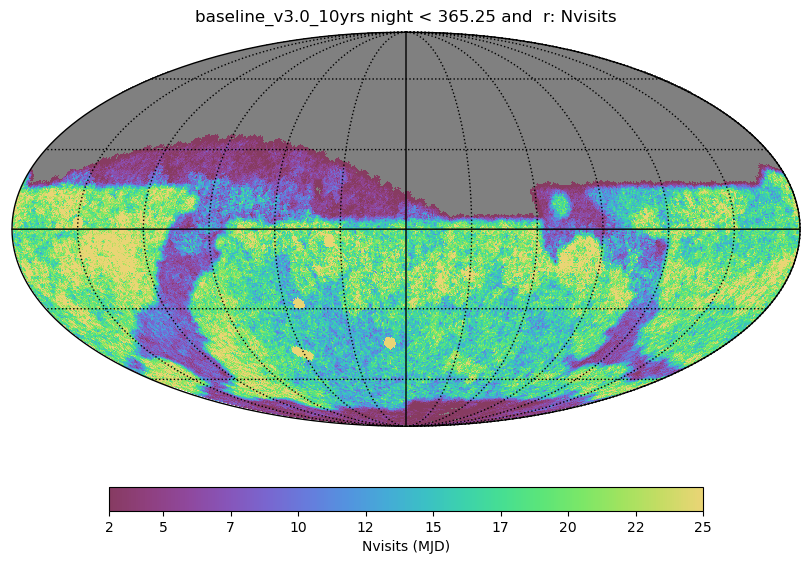

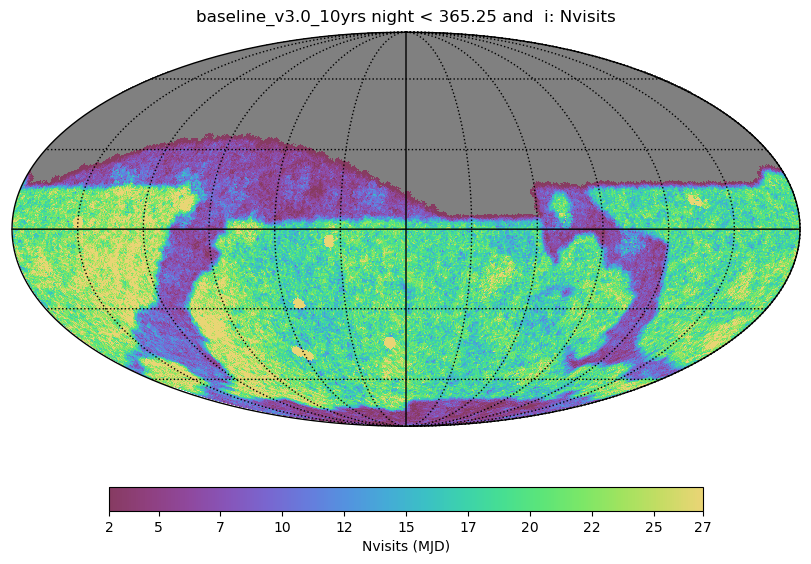

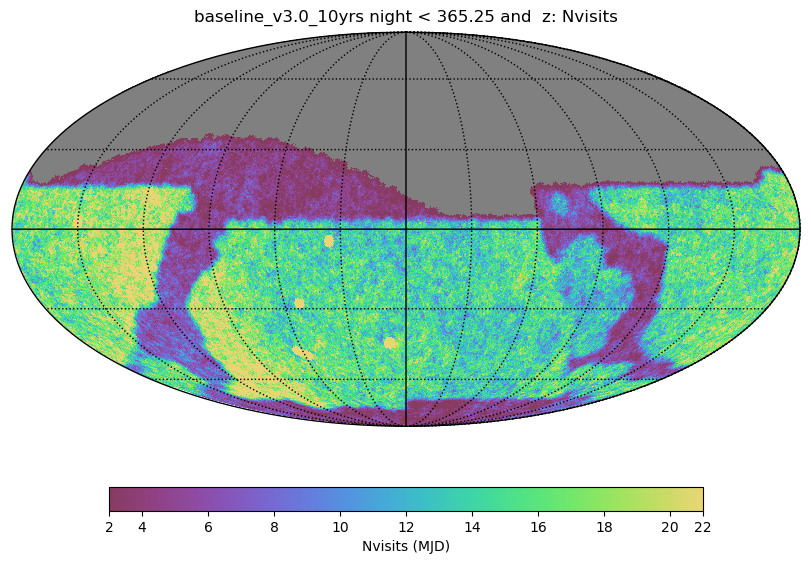

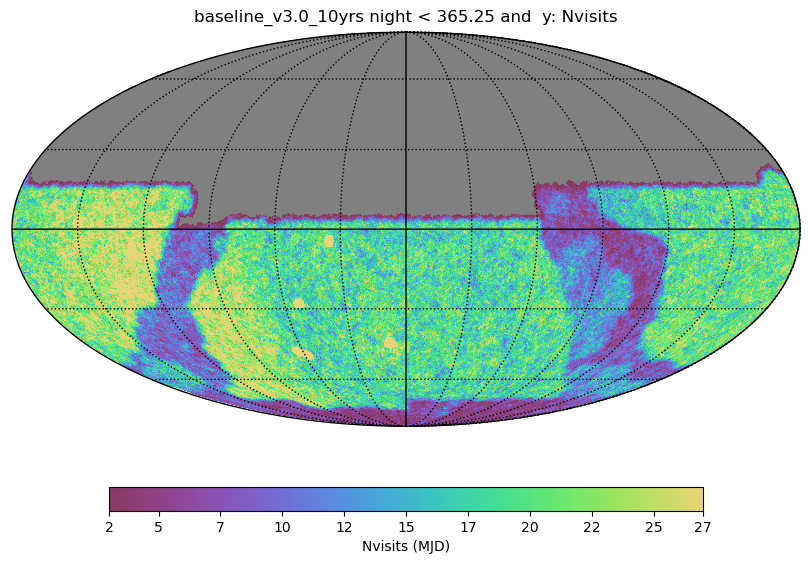

In [39]:
for f in 'ugrizy':
    k = f'{f} 1yr'
    ph.set_metric_bundles([visit_maps[k]])
    colormax = np.percentile(visit_maps[k].metric_values.compressed(), 95)
    plotDict = {'figsize': (8, 6), 'color_min': 3, 'color_max': colormax}
    ph.plot(plot_func=maf.HealpixSkyMap(), plot_dicts=plotDict)

[24.64372396 24.63180925 24.46286925 24.61641046 24.50679412 24.68298758
 24.82870106 24.60141595 24.50719408 24.53295886 24.66404577 24.74189121
 24.7845932  24.60159091 24.71852488 24.66953932 24.48027707 24.54508004
 24.77581598 24.79208625 24.5931555  24.5691003  24.733536   24.33586269
 24.31986906 24.30694    24.32676771 24.31362096 24.30359279]
[60292.28747939 60292.28883024 60293.29522726 60293.29567417
 60310.29553477 60318.21125218 60322.25368757 60328.18771859
 60347.26910313 60350.26092215 60354.12272822 60355.23241968
 60379.13960043 60382.20381086 60406.03000856 60410.04657488
 60430.00507354 60432.03897604 60432.9815127  60432.98376498
 60436.06128601 60436.06083872 60438.01293207 60582.38983399
 60582.39294801 60582.39606278 60582.39007531 60582.39318932
 60582.39630407]


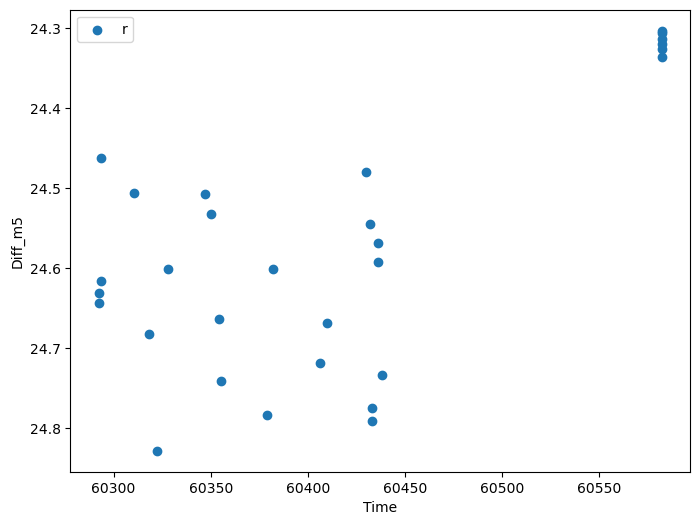

In [10]:
index = 0 #Index = 11333 for longest time series
longest_series = 0.0

for k in range(0, len(lcs) - 1): #All of the points on the graph are from the same index
    for j in range(0, len(lcs[k]['mjd']) - 1):
        if lcs[k]['mjd'][j] > longest_series:
            longest_series = lcs[k]['mjd'][j]
            index = k
        else:
            pass

my_y = lcs[index]['diff_m5'] 
print(my_y)

my_x = lcs[index]['mjd'] 
print(my_x)

my_band = lcs[index]['band'][0] #By construction, all the filters are the same

plt.figure(figsize=(8, 6))
plt.scatter(my_x, my_y, label = my_band)

plt.legend()  
plt.ylabel(f"Diff_m5")
plt.xlabel(f"Time")  
plt.gca().invert_yaxis()
    
#Look for longest time series (make a for loop for the arrays and use if/else statements to find longest time series)

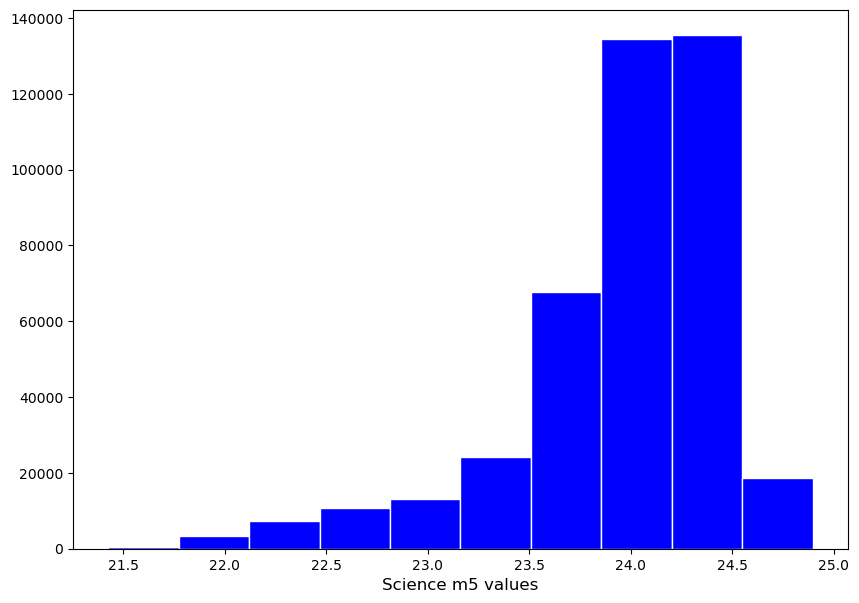

In [27]:
#Create histogram for science m5, template m5, diff m5, # of alerts

#Science m5
science_m5_data = np.array([])

for k in range(0, len(lcs) - 1):
    science_m5_data = np.append(science_m5_data, lcs[k]['science_m5'])
    
fig, ax = plt.subplots(figsize = (10,7))
ax.hist(science_m5_data, bins = 10)
plt.hist(science_m5_data, edgecolor = "white", color="blue")

plt.xlabel('Science m5 values', fontsize='large')
plt.show()

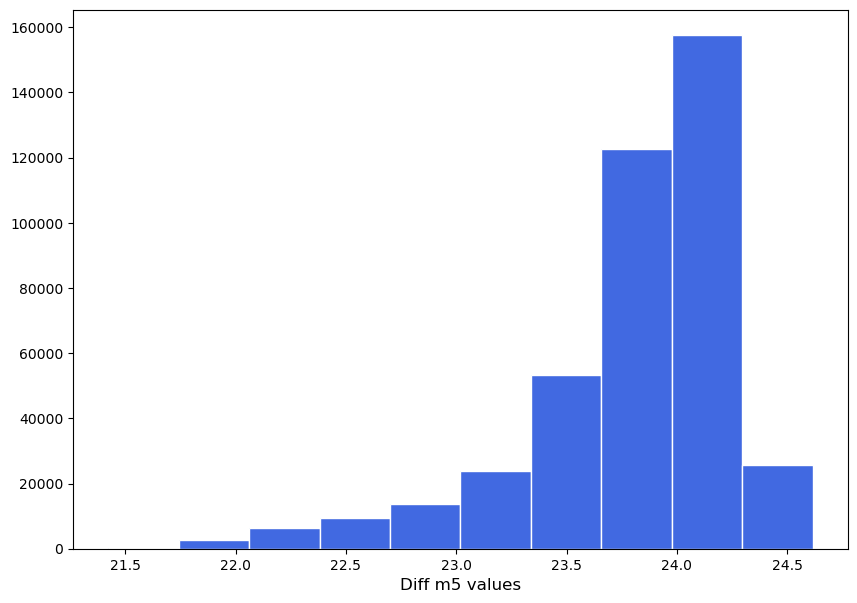

In [28]:
#Diff m5
diff_m5_data = np.array([])

for k in range(0, len(lcs) - 1):
    diff_m5_data = np.append(diff_m5_data, lcs[k]['diff_m5'])
    
fig, ax = plt.subplots(figsize = (10,7))
ax.hist(diff_m5_data, bins = 10)
plt.hist(diff_m5_data, edgecolor = "white", color="royalblue")

plt.xlabel('Diff m5 values', fontsize='large')
plt.show()

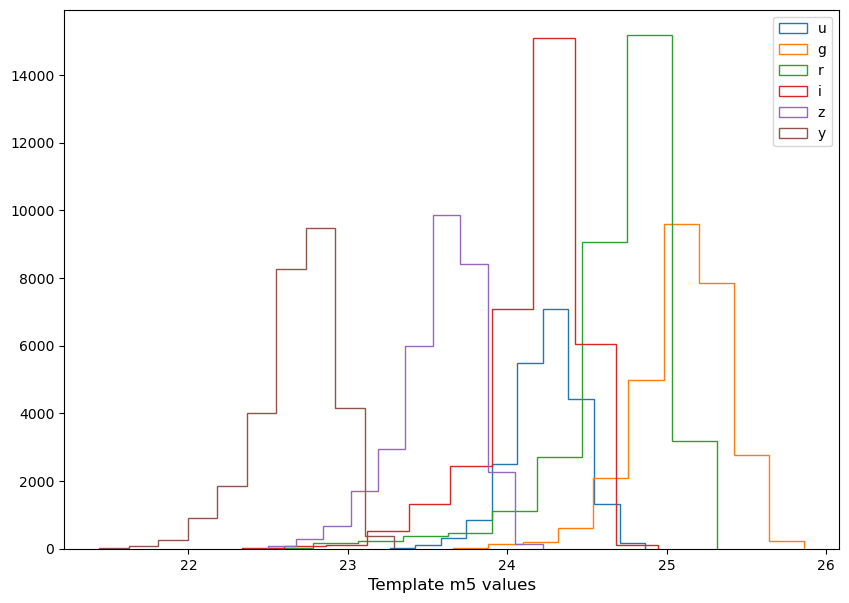

In [18]:
#Template m5 (all the other histograms only focus on the 'r' band)

fig, ax = plt.subplots(figsize = (10,7))

for f in 'ugrizy':
    temp_m5_data = [v['Template_m5'] for v in bdict[f].metric_values.tolist() if v is not None]
    plt.hist(temp_m5_data, label = f, histtype = "step")

plt.xlabel('Template m5 values', fontsize='large')
plt.legend()
plt.show()

In [12]:
temp_m5_data

masked_array(data=[0.00000000e+000, 2.24576852e-314, 1.94274517e-318, ...,
                   2.45044438e+001, 2.42832739e+001, 2.42328114e+001],
             mask=False,
       fill_value=1e+20)

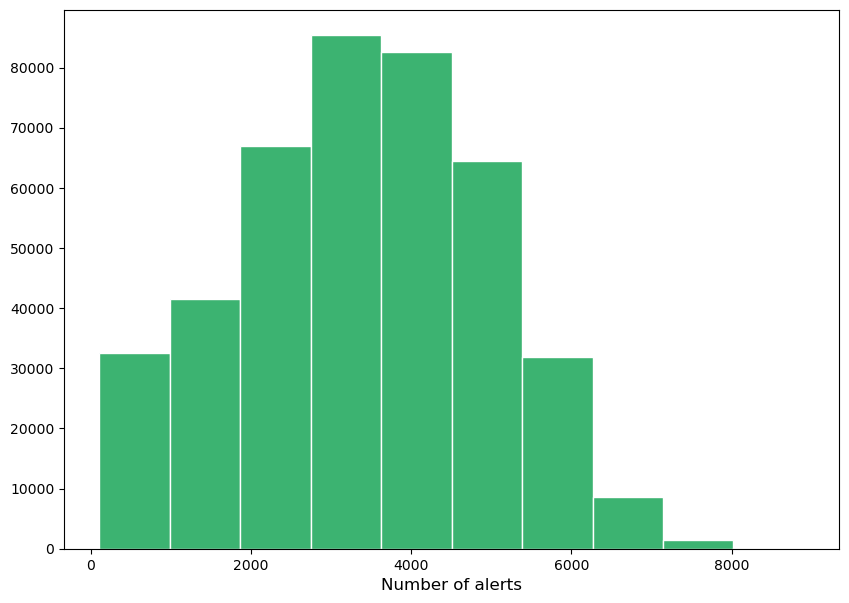

In [30]:
# Number of alerts

alerts_data = np.array([])

for k in range(0, len(lcs) - 1):
    alerts_data = np.append(alerts_data, lcs[k]['n_alerts'])
    
fig, ax = plt.subplots(figsize = (10,7))
ax.hist(alerts_data, bins = 10)
plt.hist(alerts_data, edgecolor = "white", color="mediumseagreen")

plt.xlabel('Number of alerts', fontsize='large')
plt.show()